# Import packages and define functions

In [74]:
import os
os.environ['MKL_NUM_THREADS'] = '1'
import numpy as np
import proper
from scipy.interpolate import interp1d
from roman_phasec_proper import trim, mft2, ffts, polmap
import roman_phasec_proper

import astropy.units as u
import astropy.io.fits as fits
from pathlib import Path
import misc

display_wfs = True
save_wfs = True
save_maps = True

cgi_dir = Path('/groups/douglase/kians-data-files/roman-cgi-phasec-data')
map_dir_new = cgi_dir/'hlc-opds'
wf_dir = Path('/groups/douglase/kians-data-files/roman-cgi-wfs/hlc')

def display_wave(wavefront):
    wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
    wf_phase = proper.prop_get_phase(wavefront)
    wf_sampling = proper.prop_get_sampling(wavefront)*u.m/u.pix
    misc.myimshow2(wf_int, wf_phase, pxscl1=wf_sampling, pxscl2=wf_sampling)
    
def save_wf(wavefront, fname):
    wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
    wf_phase = proper.prop_get_phase(wavefront)
    wf_sampling = proper.prop_get_sampling(wavefront)
    
    wf = np.zeros(shape=(2, wf_int.shape[0], wf_int.shape[0]))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling
    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    
    wf_fpath = wf_dir/(fname + '_proper' + '.fits')
    wf_hdu.writeto(wf_fpath, overwrite=True)
    print( 'Wavefront saved to: '+str(wf_fpath) ) 
    
def save_map(dmap, wavefront, fname):
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header()
    dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    
    map_fpath = map_dir_new/fname
    dmaphdu.writeto(map_fpath, overwrite=True)
    print('OPD map saved to: '+str(map_fpath))


###############################################################################33
def radius( n ):
    x = np.arange( n ) - int(n)//2
    r = np.sqrt( x*x + x[:,np.newaxis]**2 )
    return r

###############################################################################33
def angle( n ):
    x = np.arange( n ) - int(n)//2
    return np.arctan2( x[:,np.newaxis], x ) * (180 / np.pi)

###############################################################################33
def glass_index( glass, lambda_m, data_dir ):
    a = np.loadtxt( data_dir + '/glass/' + glass+'_index.txt' )  # lambda_um index pairs
    f = interp1d( a[:,0], a[:,1], kind='cubic' )
    return f( lambda_m*1e6 )

###############################################################################33
def to_from_singlet( wavefront, dz_to_lens, dz_from_lens, r1, r2, thickness, nglass, 
    surface_name, next_surface_name, ERROR_MAP_FILE=' ', TO_PLANE=0):

    # single thick lens
    # r1, r2 = front & rear radii of curvature

    f = 1 / ( (nglass - 1) * ( 1.0/r1 - 1.0/r2 + (nglass - 1)*thickness / (nglass*r1*r2) ) )      # effective focal length
    h1 = -f*(nglass - 1)*thickness / (nglass*r2)    # front principal plane
    h2 = -f*(nglass - 1)*thickness / (nglass*r1)    # rear principal plane

    proper.prop_propagate( wavefront, dz_to_lens+h1, surface_name )
    proper.prop_lens( wavefront, f, surface_name )
    if ERROR_MAP_FILE != ' ': 
        dmap = proper.prop_errormap( wavefront, ERROR_MAP_FILE, WAVEFRONT=True )
        if save_maps: save_map(dmap, wavefront, ERROR_MAP_FILE)
    
    if display_wfs: display_wave(wavefront)
    if save_wfs: save_wf(wavefront, surface_name)
    
    proper.prop_propagate( wavefront, -h2+dz_from_lens, next_surface_name, TO_PLANE=TO_PLANE )
    
    if display_wfs: display_wave(wavefront)
    if save_wfs: save_wf(wavefront, next_surface_name)
        
    return

###############################################################################33
def to_from_doublet( wavefront, dz_to_lens, dz_from_lens, r1_a, r2_a, thickness_a, nglass_a, separation_m, 
    r1_b, r2_b, thickness_b, nglass_b, surface_name, next_surface_name, ERROR_MAP_FILES=' ', TO_PLANE=0):

    # two air-gapped thick lenses (lenses a & b)

    f_a = 1 / ( (nglass_a - 1) * ( 1.0/r1_a - 1.0/r2_a + (nglass_a - 1)*thickness_a / (nglass_a*r1_a*r2_a) ) )
    h1_a = -f_a*(nglass_a - 1)*thickness_a / (nglass_a*r2_a)
    h2_a = -f_a*(nglass_a - 1)*thickness_a / (nglass_a*r1_a)

    f_b = 1 / ( (nglass_b - 1) * ( 1.0/r1_b - 1.0/r2_b + (nglass_b - 1)*thickness_b / (nglass_b*r1_b*r2_b) ) )
    h1_b = -f_b*(nglass_b - 1)*thickness_b / (nglass_b*r2_b)
    h2_b = -f_b*(nglass_b - 1)*thickness_b / (nglass_b*r1_b)

    proper.prop_propagate( wavefront, dz_to_lens+h1_a, surface_name )
    proper.prop_lens( wavefront, f_a, surface_name+' lens #1' )
    if ERROR_MAP_FILES != ' ':
        dmap = proper.prop_errormap( wavefront, ERROR_MAP_FILES[0], WAVEFRONT=True )
        if save_maps: save_map(dmap, wavefront, ERROR_MAP_FILES[0])
    
    if display_wfs: display_wave(wavefront)
    if save_wfs: save_wf(wavefront, surface_name +'_lens1')
    
    proper.prop_propagate( wavefront, -h2_a+separation_m+h1_b )
    proper.prop_lens( wavefront, f_b, surface_name+' lens #2' )
    if ERROR_MAP_FILES != ' ':
        if ERROR_MAP_FILES[1] != ' ':
            dmap = proper.prop_errormap( wavefront, ERROR_MAP_FILES[1], WAVEFRONT=True )
            if save_maps: save_map(dmap, wavefront, ERROR_MAP_FILES[1])
    
    if display_wfs: display_wave(wavefront)
    if save_wfs: save_wf(wavefront, surface_name+'_lens2')
    
    proper.prop_propagate( wavefront, -h2_b+dz_from_lens, next_surface_name, TO_PLANE=TO_PLANE )
    
    if display_wfs: display_wave(wavefront)
    if save_wfs: save_wf(wavefront, next_surface_name)
        
    return

In [75]:
data_dir = roman_phasec_proper.data_dir
map_dir = data_dir + roman_phasec_proper.map_dir
polfile = data_dir + roman_phasec_proper.polfile

pupil_array = 0             # 2D array containing pupil pattern (overrides default)
pupil_mask_array = 0        # 2D array containing SPC pupil mask pattern (overrides default)
fpm_array = 0               # 2D array containing FPM mask pattern (overrides default)
fpm_mask = 0                # 2D array where 1=FPM pattern defined, 0=substrate
lyot_stop_array = 0         # 2D array containing Lyot stop mask pattern (overrides default)
field_stop_array = 0        # 2D array containing field stop mask pattern (overrides default)

cor_type = 'hlc'            # coronagraph type ('hlc', 'spc-spec_band2', 'spc-spec_band3', 'spc-wide', 'none')
source_x_offset_mas = 0     # source offset in mas (tilt applied at primary)
source_y_offset_mas = 0                 
source_x_offset = 0         # source offset in lambda0_m/D radians (tilt applied at primary)
source_y_offset = 0                 
polaxis = 0                 # polarization axis aberrations: 
                            #    -2 = -45d in, Y out 
                            #    -1 = -45d in, X out 
                            #     1 = +45d in, X out 
                            #     2 = +45d in, Y out 
                            #     5 = mean of modes -1 & +1 (X channel polarizer)
                            #     6 = mean of modes -2 & +2 (Y channel polarizer)
                            #    10 = mean of all modes (no polarization filtering)
use_errors = 1              # use optical surface phase errors? 1 or 0 
zindex = np.array([0,0])    # array of Zernike polynomial indices
zval_m = np.array([0,0])    # array of Zernike coefficients (meters RMS WFE)
sm_despace_m = 0            # secondary mirror despace (meters) 
use_pupil_defocus = 1       # include pupil defocus
use_aperture = 0            # use apertures on all optics? 1 or 0
cgi_x_shift_pupdiam = 0     # X,Y shear of wavefront at FSM (bulk displacement of CGI); normalized relative to pupil diameter
cgi_y_shift_pupdiam = 0          
cgi_x_shift_m = 0           # X,Y shear of wavefront at FSM (bulk displacement of CGI) in meters
cgi_y_shift_m = 0          
end_at_fsm = 0              # end propagation after propagating to FSM (no FSM errors)
fsm_x_offset_mas = 0        # offset in focal plane caused by tilt of FSM in mas
fsm_y_offset_mas = 0         
fsm_x_offset = 0            # offset in focal plane caused by tilt of FSM in lambda0/D
fsm_y_offset = 0            
focm_z_shift_m = 0          # offset (meters) of focus correction mirror (+ increases path length)
use_hlc_dm_patterns = 0     # use Dwight's HLC default DM wavefront patterns? 1 or 0
use_dm1 = 0                 # use DM1? 1 or 0
use_dm2 = 0                 # use DM2? 1 or 0
dm_sampling_m = 0.9906e-3   # actuator spacing in meters
dm1_m = np.zeros((48,48))
dm1_xc_act = 23.5           # for 48x48 DM, wavefront centered at actuator intersections: (0,0) = 1st actuator center
dm1_yc_act = 23.5              
dm1_xtilt_deg = 0           # tilt around X axis (deg)
dm1_ytilt_deg = 9.65        # effective DM tilt in deg including 9.65 deg actual tilt and pupil ellipticity
dm1_ztilt_deg = 0           # rotation of DM about optical axis (deg)
dm2_m = np.zeros((48,48))
dm2_xc_act = 23.5           # for 48x48 DM, wavefront centered at actuator intersections: (0,0) = 1st actuator center
dm2_yc_act = 23.5               
dm2_xtilt_deg = 0           # tilt around X axis (deg)
dm2_ytilt_deg = 9.65        # effective DM tilt in deg including 9.65 deg actual tilt and pupil ellipticity
dm2_ztilt_deg = 0           # rotation of DM about optical axis (deg)
hlc_dm1_file = ''
hlc_dm2_file = ''
use_pupil_mask = 1          # SPC only: use SPC pupil mask (0 or 1)
mask_x_shift_pupdiam = 0    # X,Y shear of shaped pupil mask; normalized relative to pupil diameter
mask_y_shift_pupdiam = 0          
mask_x_shift_m = 0          # X,Y shear of shaped pupil mask in meters
mask_y_shift_m = 0          
use_fpm = 1                 # use occulter? 1 or 0
fpm_x_offset = 0            # FPM x,y offset in lambda0/D
fpm_y_offset = 0
fpm_x_offset_m = 0          # FPM x,y offset in meters
fpm_y_offset_m = 0
fpm_z_shift_m = 0           # occulter offset in meters along optical axis (+ = away from prior optics)
pinhole_diam_m = 0          # FPM pinhole diameter in meters
end_at_fpm_exit_pupil = 0   # return field at FPM exit pupil?
use_lyot_stop = 1           # use Lyot stop? 1 or 0
lyot_x_shift_pupdiam = 0    # X,Y shear of Lyot stop mask; normalized relative to pupil diameter
lyot_y_shift_pupdiam = 0  
lyot_x_shift_m = 0          # X,Y shear of Lyot stop mask in meters
lyot_y_shift_m = 0  
use_field_stop = 1          # use field stop (HLC)? 1 or 0
field_stop_radius_lam0 = 0  # field stop radius in lambda0/D
field_stop_x_offset = 0     # field stop offset in lambda0/D
field_stop_y_offset = 0
field_stop_x_offset_m = 0   # field stop offset in meters
field_stop_y_offset_m = 0
use_lens_errors = 1         # apply lens errors (1=yes)? Overrides whatever use_errors is set to
use_pupil_lens = 0          # use pupil imaging lens? 0 or 1
use_defocus_lens = 0        # use defocusing lens? Options are 1, 2, 3, 4
end_at_exit_pupil = 0       # return exit pupil corresponding to final image plane
final_sampling_m = 0        # final sampling in meters (overrides final_sampling_lam0)
final_sampling_lam0 = 0     # final sampling in lambda0/D
output_dim = 256    # dimension of output in pixels (overrides output_dim0)
save_ref_radius = 0

# SPECIFY OPTIONS.

In [76]:
lambda_m = 575e-9
# lambda_m = 546.25e-9

cor_type = 'hlc' # coronagraph type ('hlc', 'spc-spec_band2', 'spc-spec_band3', 'spc-wide', 'none')    
source_x_offset = 0
source_y_offset = 0       
use_fpm = 1

use_hlc_dm_patterns = 0
use_errors = 1
use_dm1 = 0
use_dm2 = 0
if use_hlc_dm_patterns==1:
    dm1_fname = 'hlc_dm1.fits'
    dm2_fname = 'hlc_dm2.fits'
else:
    dm1_fname = 'hlc_best_contrast_dm1.fits'
    dm2_fname = 'hlc_best_contrast_dm2.fits'
if use_dm1==0: dm1_m = 0
else: dm1_m = proper.prop_fits_read( roman_phasec_proper.lib_dir + '/examples/' + dm1_fname )
if use_dm2==0: dm2_m = 0
else: dm2_m = proper.prop_fits_read( roman_phasec_proper.lib_dir + '/examples/' + dm2_fname )
polaxis = 0
use_field_stop = 0
use_pupil_defocus = 1

final_sampling_lam0 = 0.1
output_dim = 256

# Initialize the mode based parameters.

In [77]:
is_spc = False
is_hlc = False

if cor_type.find('hlc') != -1:
    is_hlc = True
    if cor_type == 'hlc' or cor_type == 'hlc_band1':
        file_directory = data_dir + '/hlc_20190210b/'         # must have trailing "/"
        lambda0_m = 0.575e-6
        hlc_dm1_file = file_directory + 'hlc_dm1.fits'
        hlc_dm2_file = file_directory + 'hlc_dm2.fits'
    elif cor_type == 'hlc_band2':
        file_directory = data_dir + '/hlc_20200617c_band2/'   # must have trailing "/"
        lambda0_m = 0.660e-6
    elif cor_type == 'hlc_band3':
        file_directory = data_dir + '/hlc_20200614b_band3/'   # must have trailing "/"
        lambda0_m = 0.730e-6
    elif cor_type == 'hlc_band4':
        file_directory = data_dir + '/hlc_20200609b_band4/'   # must have trailing "/"
        lambda0_m = 0.825e-6
    else:
        print("Unsupported HLC mode")
        raise Exception(' ')
    pupil_diam_pix = 309.0
    pupil_file = file_directory + 'pupil.fits'
    if use_fpm != 0:
        # find nearest available FPM wavelength that matches specified wavelength
        lam_um = lambda_m * 1e6
        f = open( file_directory + 'fpm_files.txt' )
        fpm_nlam = int(f.readline())
        fpm_lam_um = np.zeros((fpm_nlam),dtype=float)
        for j in range(0,fpm_nlam):
            fpm_lam_um[j] = float(f.readline())
        fpm_lams = [j.strip() for j in f.readlines()] 
        f.close()
        diff = np.abs(fpm_lam_um - lam_um)
        w = np.argmin( diff )
        if diff[w] > 0.0001:
            print("Error in roman_phasec: requested wavelength not within 0.1 nm of nearest available FPM wavelength.")
            print("  requested (um) = " + str(lam_um) + "  closest available (um) = " + str(fpm_lam_um[w]) ) 
            raise Exception(' ')
        fpm_rootname = file_directory + fpm_lams[w]
        (r, header) = proper.prop_fits_read( fpm_rootname+'real.fits', header=True ) 
        i = proper.prop_fits_read( fpm_rootname+'imag.fits' )
        fpm_array = r + i * 1j
        fpm_mask = (r != r[0,0]).astype(int)
        fpm_lam0_m = header['FPMLAM0M']             # FPM reference wavelength
        fpm_sampling_lam0divD = header['FPMDX']     # lam/D sampling @ fpm_lam0_m
    lyot_stop_file = file_directory + 'lyot_rotated.fits'
    field_stop_radius_lam0 = 9.7
    if use_defocus_lens != 0 or use_pupil_lens != 0:
        n = 2048
    else:
        n = 1024
    n_mft = 1400

# Define focal lengths and distances.

In [78]:
diam = 2.363114
fl_pri = 2.838279206904720
d_pri_sec = 2.285150508110035 + sm_despace_m
fl_sec = -0.654200796568004
diam_sec = 0.58166
d_sec_pomafold = 2.993753469304728 + sm_despace_m
diam_pomafold = 0.09
d_pomafold_m3 = 1.680935841598811
fl_m3 = 0.430216463069001
diam_m3 = 0.2
d_m3_pupil = 0.469156807765176
d_m3_m4 = 0.943514749358944
fl_m4 = 0.116239114833590
diam_m4 = 0.07
d_m4_m5 = 0.429145636743193
fl_m5 = 0.198821518772608
d_m5_pupil = 0.716529242927776
diam_m5 = 0.07
d_m5_ttfold = 0.351125431220770
diam_ttfold = 0.06
d_ttfold_fsm = d_m5_pupil - d_m5_ttfold 
if use_pupil_defocus:
    d_ttfold_fsm = d_ttfold_fsm + 0.033609  # 33.6 mm to put pupil 6 mm from SPC mask
diam_fsm = 0.0508
d_fsm_oap1 = 0.354826767220001
fl_oap1 = 0.503331895563883
diam_oap1 = 0.060
d_oap1_focm = 0.768029932093727 + focm_z_shift_m
diam_focm = 0.035
d_focm_oap2 = 0.314507535543064 + focm_z_shift_m
fl_oap2 = 0.579205571254990
diam_oap2 = 0.060
d_oap2_dm1 = 0.775857408587825
d_dm1_dm2 = 1.0
d_dm2_oap3 = 0.394833855161549
fl_oap3 = 1.217276467668519
diam_oap3 = 0.06
d_oap3_fold3 = 0.505329955078121
diam_fold3 = 0.06
d_fold3_oap4 = 1.158897671642761
fl_oap4 = 0.446951159052363
diam_oap4 = 0.06
d_oap4_pupilmask = 0.423013568764728
d_pupilmask_oap5 = 0.408810704327559
fl_oap5 = 0.548189354706822
diam_oap5 = 0.06
d_oap5_fpm = fl_oap5                    # to front of FPM 
fpm_thickness = 0.006363747896388863    # account for FPM thickness (inclination included)
fpm_index = glass_index('SILICA',lambda_m,data_dir)
d_fpm_oap6 = fpm_thickness / fpm_index + 0.543766629917668     # from front of FPM
fl_oap6 = d_fpm_oap6
diam_oap6 = 0.054
d_oap6_lyotstop = 0.687476361491529
d_oap6_exitpupil = d_oap6_lyotstop - 6e-3
d_lyotstop_oap7 = 0.401748561745987
fl_oap7 = 0.708251420923810
diam_oap7 = 0.054
d_oap7_fieldstop = fl_oap7 
d_fieldstop_oap8 = 0.210985170345932 * 0.997651
fl_oap8 = d_fieldstop_oap8
diam_oap8 = 0.026
d_oap8_pupil = 0.237561587674008
d_pupil_filter = 0.130
d_oap8_filter = d_oap8_pupil + d_pupil_filter   # to front of filter
diam_filter = 0.009
filter_thickness = 0.004016105782012525      # account for filter thickness (inclination included)
filter_index = glass_index('SILICA',lambda_m,data_dir)
d_filter_lens = filter_thickness / filter_index + 0.210581269256657095  # from front of filter
diam_lens = 0.0104
d_lens_fold4 = 0.202432155667761
if use_pupil_lens != 0:
    d_lens_fold4 = d_lens_fold4 - 0.0002   # from back of pupil imaging lens
elif use_defocus_lens != 0:
    d_lens_fold4 = d_lens_fold4 + 0.001    # doublet is 1 mm longer than singlet, so make up for it
diam_fold4 = 0.036
d_fold4_image = 0.050000152941020161

# Test the initialization and the polarization aberrations.

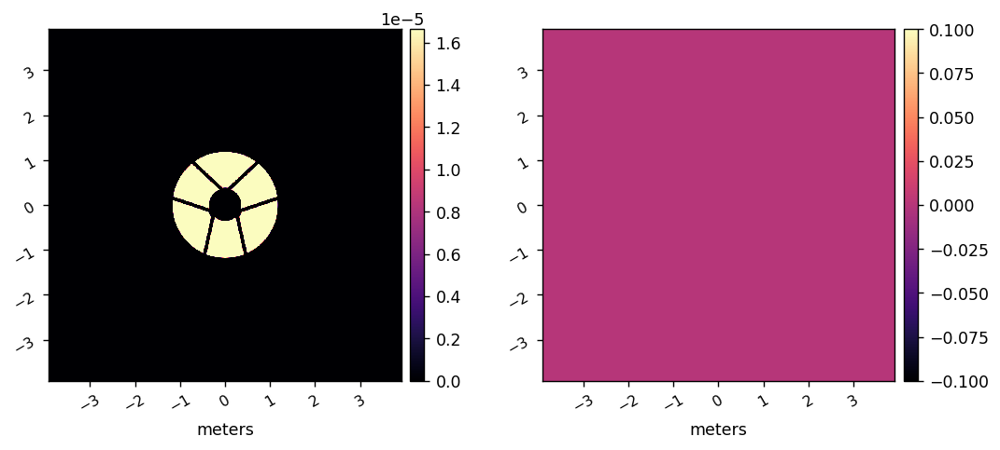

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/polmap_proper.fits


In [79]:
wavefront = proper.prop_begin( diam, lambda_m, n, float(pupil_diam_pix)/n )
if cor_type == 'none':
    proper.prop_circular_aperture( wavefront, 1.0, NORM=True )
else:
    if np.isscalar(pupil_array):
        pupil = proper.prop_fits_read( pupil_file )
        proper.prop_multiply( wavefront, trim(pupil,n) )
        pupil = 0
    else:
        proper.prop_multiply( wavefront, trim(pupil_array,n) )
if polaxis != 0: polmap( wavefront, polfile, pupil_diam_pix, polaxis )
proper.prop_define_entrance( wavefront )

if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'polmap')


# Start at primary

Applying lens
OPD map saved to:	/groups/douglase/kians-data-files/roman-cgi-phasec-data/hlc-opds/roman_phasec_PRIMARY_synthetic_phase_error_V1.0.fits


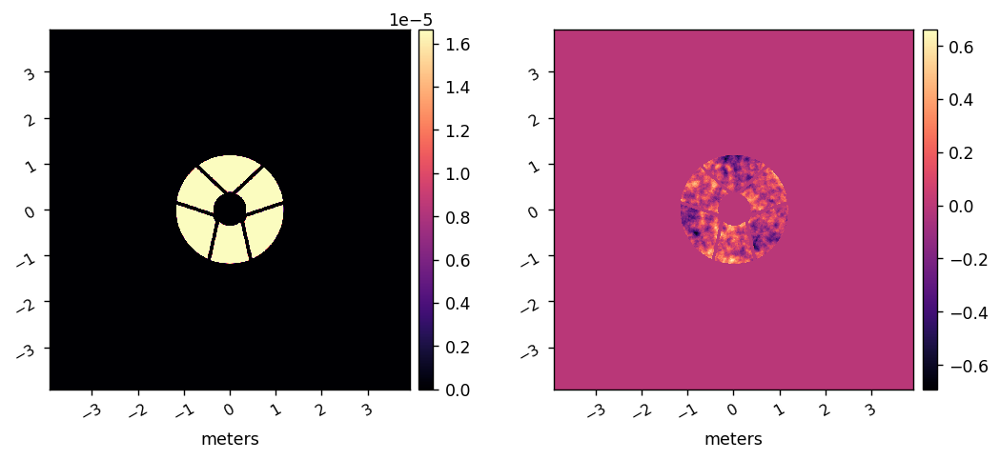

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/primary_proper.fits


In [80]:
proper.prop_lens( wavefront, fl_pri )
if source_x_offset != 0 or source_y_offset != 0:
    # compute tilted wavefront to offset source by xoffset,yoffset lambda0_m/D
    xtilt_lam = -source_x_offset * lambda0_m / lambda_m
    ytilt_lam = -source_y_offset * lambda0_m / lambda_m
    x = np.tile( (np.arange(n)-n//2)/(pupil_diam_pix/2.0), (n,1) )
    y = np.transpose(x)
    proper.prop_multiply( wavefront, np.exp(complex(0,1) * np.pi * (xtilt_lam * x + ytilt_lam * y)) )
    x = 0
    y = 0
if zindex[0] != 0: proper.prop_zernikes( wavefront, zindex, zval_m )
if use_errors != 0: 
    dmap = proper.prop_errormap( wavefront, map_dir+'roman_phasec_PRIMARY_synthetic_phase_error_V1.0.fits', WAVEFRONT=True )
    if save_maps: save_map(dmap, wavefront, 'roman_phasec_PRIMARY_synthetic_phase_error_V1.0.fits')
        
if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'primary')
    

# Propagate to the secondary mirror

Propagating to secondary
Applying lens
OPD map saved to:	/groups/douglase/kians-data-files/roman-cgi-phasec-data/hlc-opds/roman_phasec_SECONDARY_synthetic_phase_error_V1.0.fits


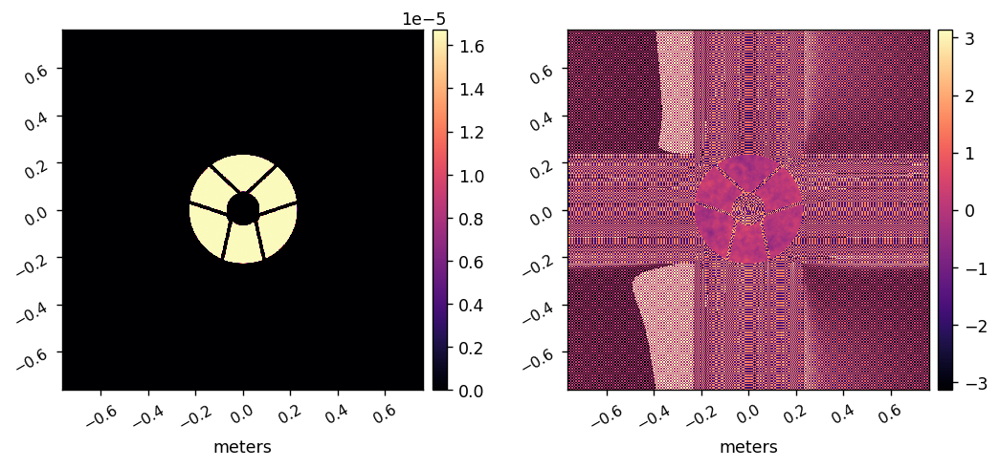

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/secondary_proper.fits


In [81]:
proper.prop_propagate( wavefront, d_pri_sec, 'secondary' )
proper.prop_lens( wavefront, fl_sec )
if use_errors != 0: 
    dmap = proper.prop_errormap( wavefront, map_dir+'roman_phasec_SECONDARY_synthetic_phase_error_V1.0.fits', WAVEFRONT=True )
    if save_maps: save_map(dmap, wavefront, 'roman_phasec_SECONDARY_synthetic_phase_error_V1.0.fits')
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_sec/2.0 )

if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'secondary')

# Propagate to poma fold

Propagating to POMA FOLD
OPD map saved to:	/groups/douglase/kians-data-files/roman-cgi-phasec-data/hlc-opds/roman_phasec_POMAFOLD_measured_phase_error_V1.1.fits


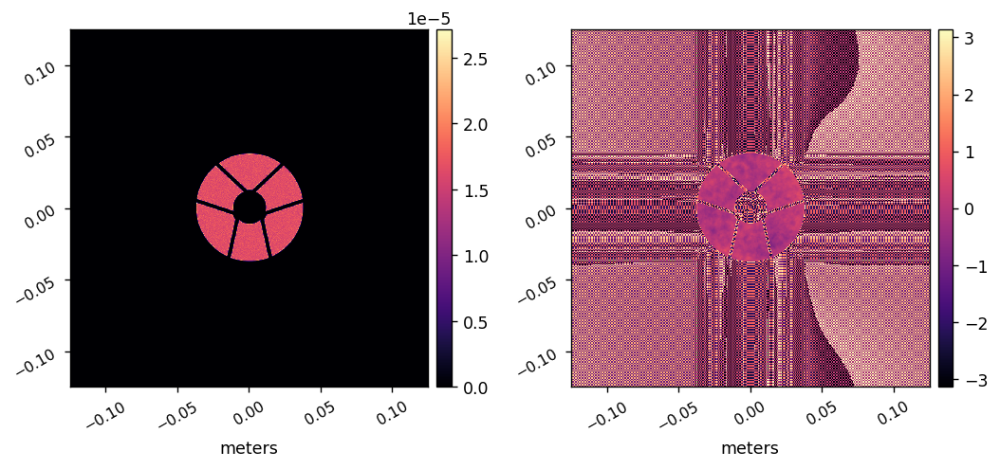

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/poma_fold_proper.fits


In [82]:
proper.prop_propagate( wavefront, d_sec_pomafold, 'POMA FOLD' )
if use_errors != 0: 
    dmap = proper.prop_errormap( wavefront, map_dir+'roman_phasec_POMAFOLD_measured_phase_error_V1.1.fits', WAVEFRONT=True )
    if save_maps: save_map(dmap, wavefront, 'roman_phasec_POMAFOLD_measured_phase_error_V1.1.fits')
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_pomafold/2.0 ) 
    
if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'poma_fold')

# Propagate to 

Propagating to M3
Applying lens
OPD map saved to:	/groups/douglase/kians-data-files/roman-cgi-phasec-data/hlc-opds/roman_phasec_M3_measured_phase_error_V1.1.fits


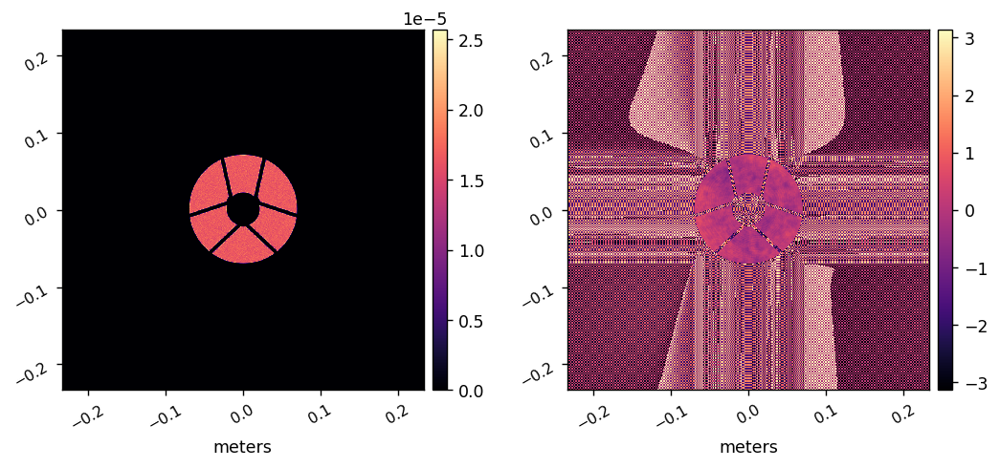

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/m3_proper.fits


In [83]:
proper.prop_propagate( wavefront, d_pomafold_m3, 'M3' )
proper.prop_lens( wavefront, fl_m3 )
if use_errors != 0: 
    dmap = proper.prop_errormap( wavefront, map_dir+'roman_phasec_M3_measured_phase_error_V1.1.fits', WAVEFRONT=True )
    if save_maps: save_map(dmap, wavefront, 'roman_phasec_M3_measured_phase_error_V1.1.fits')
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_m3/2.0 ) 
    
if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'm3')

# Propagate to 

Propagating to M4
Applying lens
OPD map saved to:	/groups/douglase/kians-data-files/roman-cgi-phasec-data/hlc-opds/roman_phasec_M4_measured_phase_error_V1.1.fits


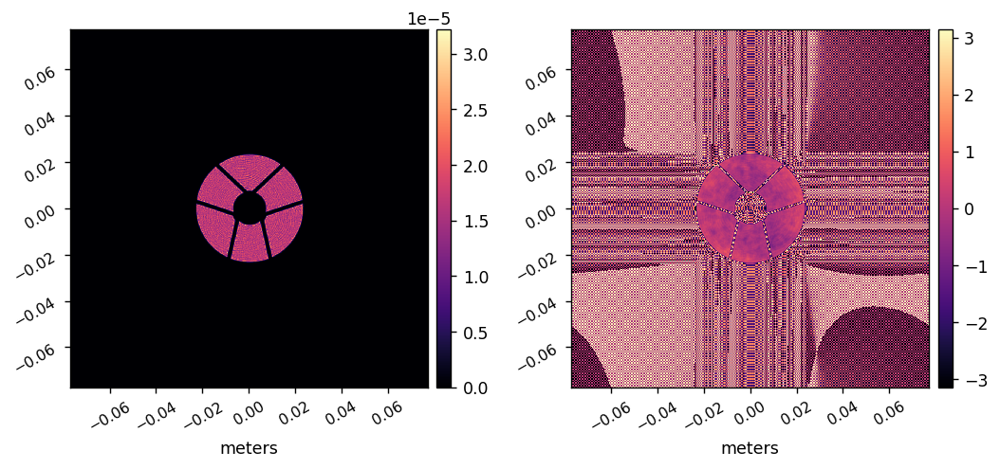

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/m4_proper.fits


In [84]:
proper.prop_propagate( wavefront, d_m3_m4, 'M4' )
proper.prop_lens( wavefront, fl_m4 )
if use_errors != 0: 
    dmap = proper.prop_errormap( wavefront, map_dir+'roman_phasec_M4_measured_phase_error_V1.1.fits', WAVEFRONT=True )
    if save_maps: save_map(dmap, wavefront, 'roman_phasec_M4_measured_phase_error_V1.1.fits')
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_m4/2.0 ) 
    
if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'm4')

# Propagate to 

Propagating to M5
Applying lens
OPD map saved to:	/groups/douglase/kians-data-files/roman-cgi-phasec-data/hlc-opds/roman_phasec_M5_measured_phase_error_V1.1.fits


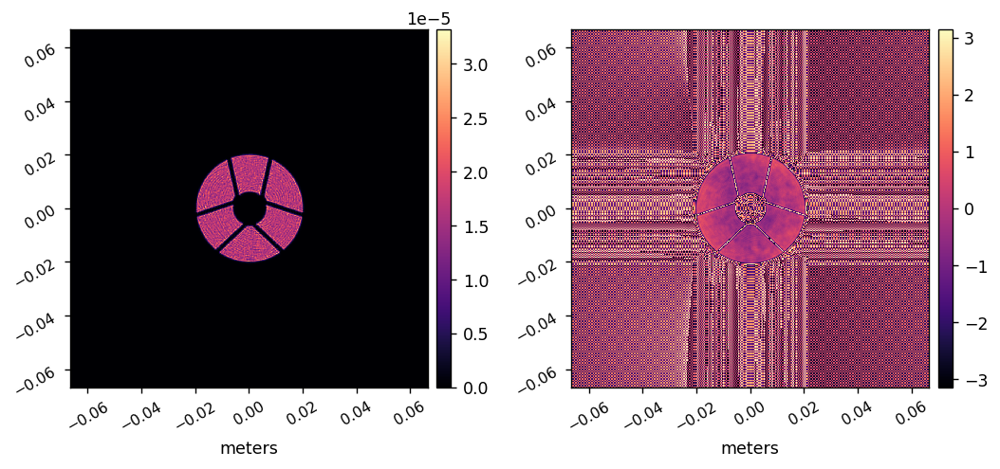

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/m5_proper.fits


In [85]:
proper.prop_propagate( wavefront, d_m4_m5, 'M5' )
proper.prop_lens( wavefront, fl_m5 )
if use_errors != 0: 
    dmap = proper.prop_errormap( wavefront, map_dir+'roman_phasec_M5_measured_phase_error_V1.1.fits', WAVEFRONT=True )
    if save_maps: save_map(dmap, wavefront, 'roman_phasec_M5_measured_phase_error_V1.1.fits')
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_m5/2.0 )
    
if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'm5')

# Propagate to 

Propagating to TT FOLD
OPD map saved to:	/groups/douglase/kians-data-files/roman-cgi-phasec-data/hlc-opds/roman_phasec_TTFOLD_measured_phase_error_V1.1.fits


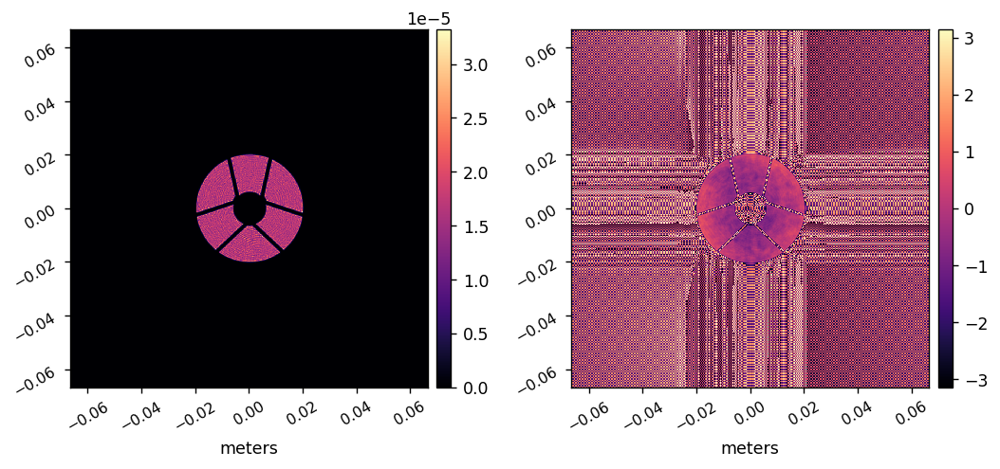

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/tt_fold_proper.fits


In [86]:
proper.prop_propagate( wavefront, d_m5_ttfold, 'TT FOLD' )
if use_errors != 0: 
    dmap = proper.prop_errormap( wavefront, map_dir+'roman_phasec_TTFOLD_measured_phase_error_V1.1.fits', WAVEFRONT=True )
    if save_maps: save_map(dmap, wavefront, 'roman_phasec_TTFOLD_measured_phase_error_V1.1.fits')
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_ttfold/2.0 )
    
if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'tt_fold')

# Propagate to 

Propagating to FSM
OPD map saved to:	/groups/douglase/kians-data-files/roman-cgi-phasec-data/hlc-opds/roman_phasec_LOWORDER_phase_error_V2.0.fits


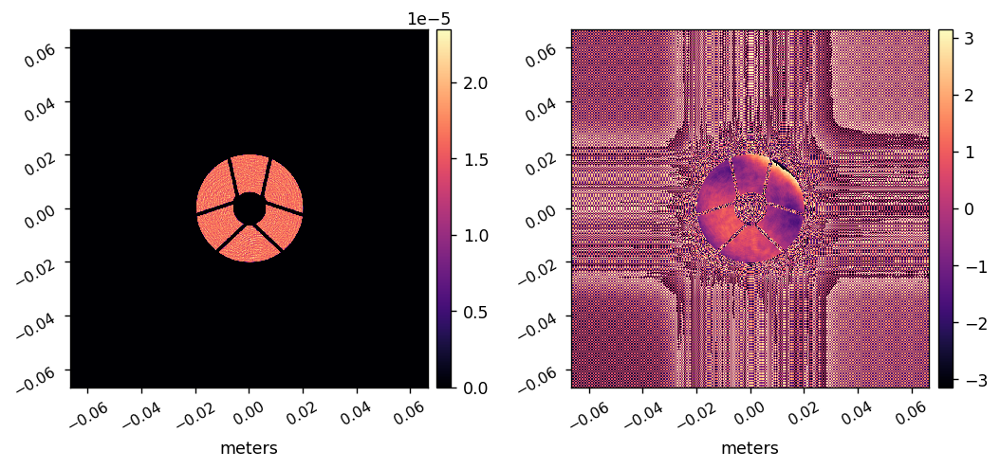

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/fsm_proper.fits


In [87]:
proper.prop_propagate( wavefront, d_ttfold_fsm, 'FSM' )
if use_errors != 0: 
    dmap = proper.prop_errormap( wavefront, map_dir+'roman_phasec_LOWORDER_phase_error_V2.0.fits', WAVEFRONT=True )
    if save_maps: save_map(dmap, wavefront, 'roman_phasec_LOWORDER_phase_error_V2.0.fits')
# if end_at_fsm == 1:
#     (wavefront, sampling_m) = proper.prop_end( wavefront, NOABS=True )
#     wavefront = trim(wavefront, n)
#     return wavefront, sampling_m
if cgi_x_shift_pupdiam != 0 or cgi_y_shift_pupdiam != 0 or cgi_x_shift_m != 0 or cgi_y_shift_m != 0:    # bulk coronagraph pupil shear
    # FFT the field, apply a tilt, FFT back
    if cgi_x_shift_pupdiam != 0 or cgi_y_shift_pupdiam != 0:
        # offsets are normalized to pupil diameter
        xt = -cgi_x_shift_pupdiam * pupil_diam_pix * float(pupil_diam_pix)/n 
        yt = -cgi_y_shift_pupdiam * pupil_diam_pix * float(pupil_diam_pix)/n
    else:
        # offsets are meters
        d_m = proper.prop_get_sampling(wavefront) 
        xt = -cgi_x_shift_m / d_m * float(pupil_diam_pix)/n 
        yt = -cgi_y_shift_m / d_m * float(pupil_diam_pix)/n 
    x = np.tile( (np.arange(n)-n//2) / (pupil_diam_pix/2.0), (n,1) )
    y = np.transpose(x)
    tilt = complex(0,1) * np.pi * (x*xt + y*yt)
    x = 0
    y = 0
    wavefront0 = proper.prop_get_wavefront(wavefront)
    wavefront0 = ffts( wavefront0, -1 )
    wavefront0 *= np.exp(tilt)
    wavefront0 = ffts( wavefront0, 1 )
    tilt = 0
    wavefront.wfarr[:,:] = proper.prop_shift_center(wavefront0)
    wavefront0 = 0
if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'roman_phasec_FSM_FLIGHT_measured_coated_phase_error_V2.0.fits', WAVEFRONT=True )
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_fsm/2.0 )
if ( fsm_x_offset != 0.0 or fsm_y_offset != 0.0 ):
    # compute tilted wavefront to offset source by fsm_x_offset,fsm_y_offset lambda0_m/D
    xtilt_lam = fsm_x_offset * lambda0_m / lambda_m
    ytilt_lam = fsm_y_offset * lambda0_m / lambda_m
    x = np.tile( (np.arange(n)-n//2) / (pupil_diam_pix/2.0), (n,1) )
    y = np.transpose(x)
    proper.prop_multiply( wavefront, np.exp(complex(0,1) * np.pi * (xtilt_lam * x + ytilt_lam * y)) )
    x = 0
    y = 0
    
if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'fsm')

# Propagate to 

Propagating to OAP1
Applying lens
OPD map saved to:	/groups/douglase/kians-data-files/roman-cgi-phasec-data/hlc-opds/roman_phasec_OAP1_phase_error_V3.0.fits


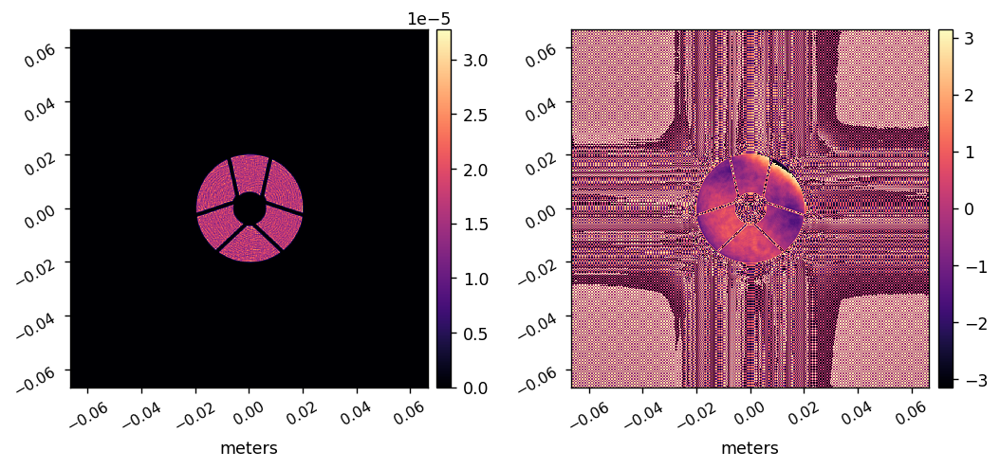

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/oap1_proper.fits


In [88]:
proper.prop_propagate( wavefront, d_fsm_oap1, 'OAP1' )
proper.prop_lens( wavefront, fl_oap1 )
if use_errors != 0: 
    dmap = proper.prop_errormap( wavefront, map_dir+'roman_phasec_OAP1_phase_error_V3.0.fits', WAVEFRONT=True )
    if save_maps: save_map(dmap, wavefront, 'roman_phasec_OAP1_phase_error_V3.0.fits')
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_oap1/2.0 )  

if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'oap1')

# Propagate to 

Propagating to FOCM
OPD map saved to:	/groups/douglase/kians-data-files/roman-cgi-phasec-data/hlc-opds/roman_phasec_FCM_EDU_measured_coated_phase_error_V2.0.fits


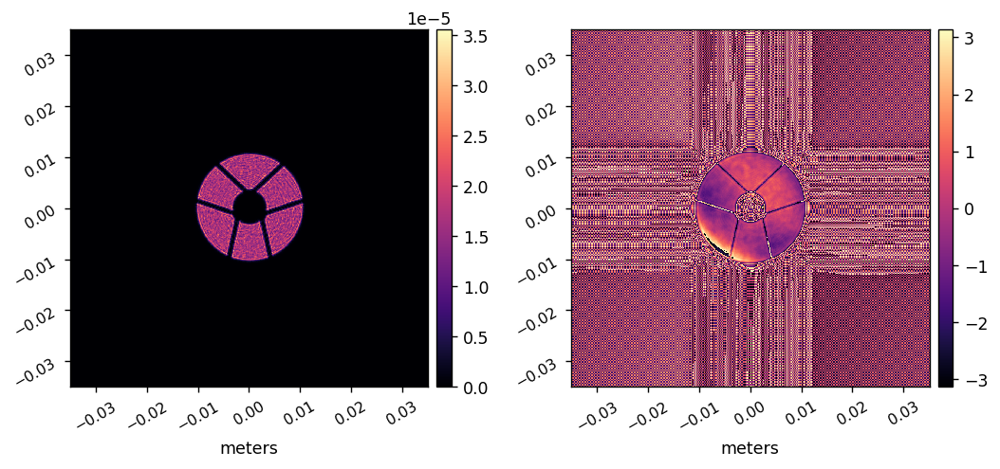

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/focm_proper.fits


In [89]:
proper.prop_propagate( wavefront, d_oap1_focm, 'FOCM' )
if use_errors != 0: 
    dmap = proper.prop_errormap( wavefront, map_dir+'roman_phasec_FCM_EDU_measured_coated_phase_error_V2.0.fits', WAVEFRONT=True )
    if save_maps: save_map(dmap, wavefront, 'roman_phasec_FCM_EDU_measured_coated_phase_error_V2.0.fits')
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_focm/2.0 )
    
if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'focm')

# Propagate to 

Propagating to OAP2
Applying lens
OPD map saved to:	/groups/douglase/kians-data-files/roman-cgi-phasec-data/hlc-opds/roman_phasec_OAP2_phase_error_V3.0.fits


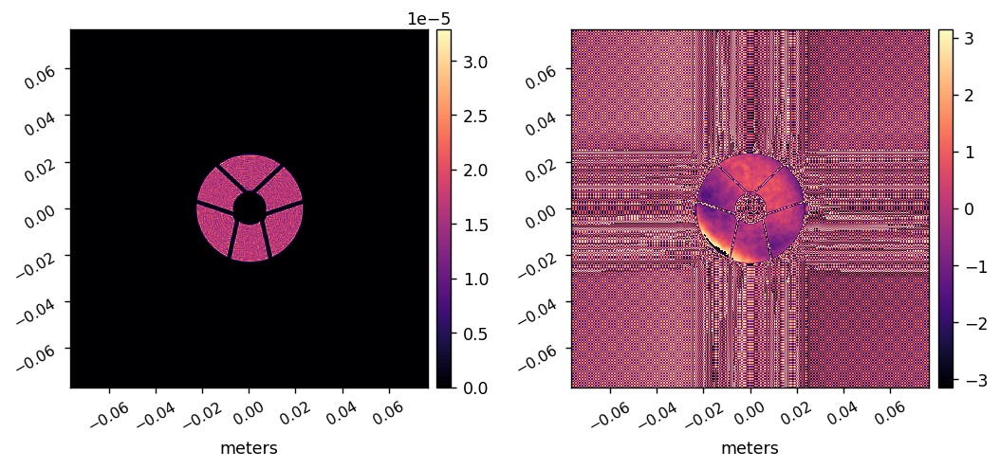

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/oap2_proper.fits


In [90]:
proper.prop_propagate( wavefront, d_focm_oap2, 'OAP2' )
proper.prop_lens( wavefront, fl_oap2 )
if use_errors != 0: 
    dmap = proper.prop_errormap( wavefront, map_dir+'roman_phasec_OAP2_phase_error_V3.0.fits', WAVEFRONT=True )
    if save_maps: save_map(dmap, wavefront, 'roman_phasec_OAP2_phase_error_V3.0.fits')
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_oap2/2.0 )  
    
if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'oap2')

# Propagate to 

Propagating to DM1
OPD map saved to:	/groups/douglase/kians-data-files/roman-cgi-phasec-data/hlc-opds/roman_phasec_DM1_phase_error_V1.0.fits


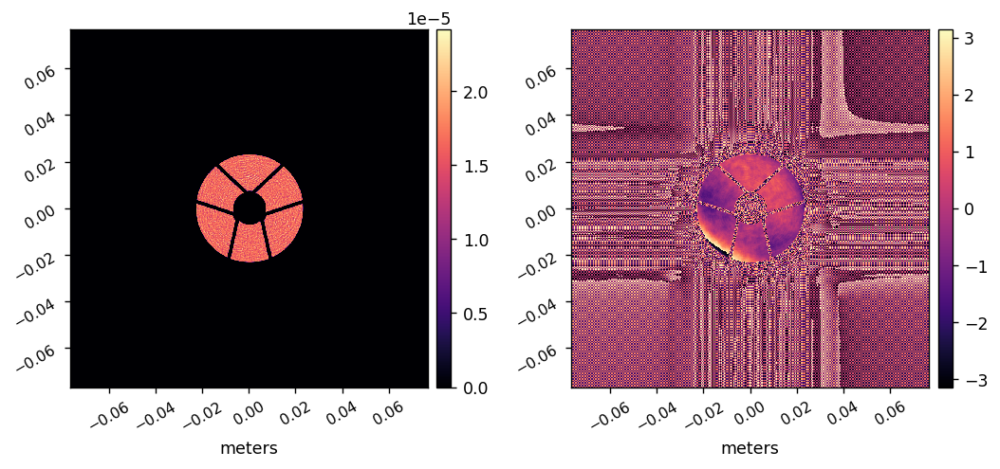

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/dm1_proper.fits


In [91]:
proper.prop_propagate( wavefront, d_oap2_dm1, 'DM1' )
if use_errors != 0: 
    dmap = proper.prop_errormap( wavefront, map_dir+'roman_phasec_DM1_phase_error_V1.0.fits', WAVEFRONT=True )
    if save_maps: save_map(dmap, wavefront, 'roman_phasec_DM1_phase_error_V1.0.fits')
if is_hlc == True and use_hlc_dm_patterns == 1 and hlc_dm1_file != '':
    hlc_dm1 = proper.prop_fits_read( hlc_dm1_file )
    dm1 = dm1_m + hlc_dm1
    use_dm1 = 1
    hlc_dm2 = proper.prop_fits_read( hlc_dm2_file )
    dm2 = dm2_m + hlc_dm2
    use_dm2 = 1
else:
    dm1 = dm1_m
    dm2 = dm2_m
if use_dm1 != 0: proper.prop_dm( wavefront, dm1, dm1_xc_act, dm1_yc_act, dm_sampling_m, XTILT=dm1_xtilt_deg, YTILT=dm1_ytilt_deg, ZTILT=dm1_ztilt_deg )

if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'dm1')

# Propagate to 

Propagating to DM2
OPD map saved to:	/groups/douglase/kians-data-files/roman-cgi-phasec-data/hlc-opds/roman_phasec_DM2_phase_error_V1.0.fits


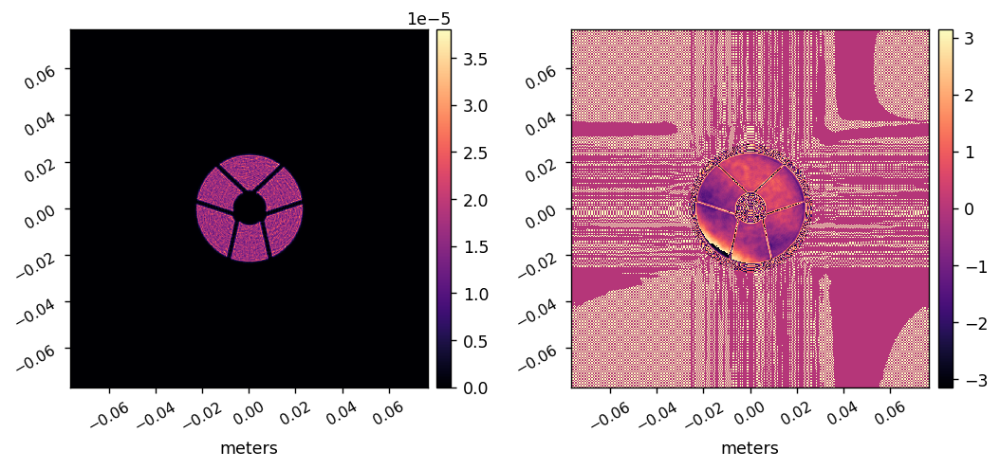

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/dm2_proper.fits


In [92]:
proper.prop_propagate( wavefront, d_dm1_dm2, 'DM2' )
if use_dm2 == 1: proper.prop_dm( wavefront, dm2, dm2_xc_act, dm2_yc_act, dm_sampling_m, XTILT=dm2_xtilt_deg, YTILT=dm2_ytilt_deg, ZTILT=dm2_ztilt_deg )
if use_errors != 0: 
    dmap = proper.prop_errormap( wavefront, map_dir+'roman_phasec_DM2_phase_error_V1.0.fits', WAVEFRONT=True )
    if save_maps: save_map(dmap, wavefront, 'roman_phasec_DM2_phase_error_V1.0.fits')
if is_hlc == True:
    dm2mask = proper.prop_fits_read( file_directory+'dm2mask.fits' )
    proper.prop_multiply( wavefront, trim(dm2mask, n) )
    dm2mask = 0
    
if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'dm2')

# Propagate to 

Propagating to OAP3
Applying lens
OPD map saved to:	/groups/douglase/kians-data-files/roman-cgi-phasec-data/hlc-opds/roman_phasec_OAP3_phase_error_V3.0.fits


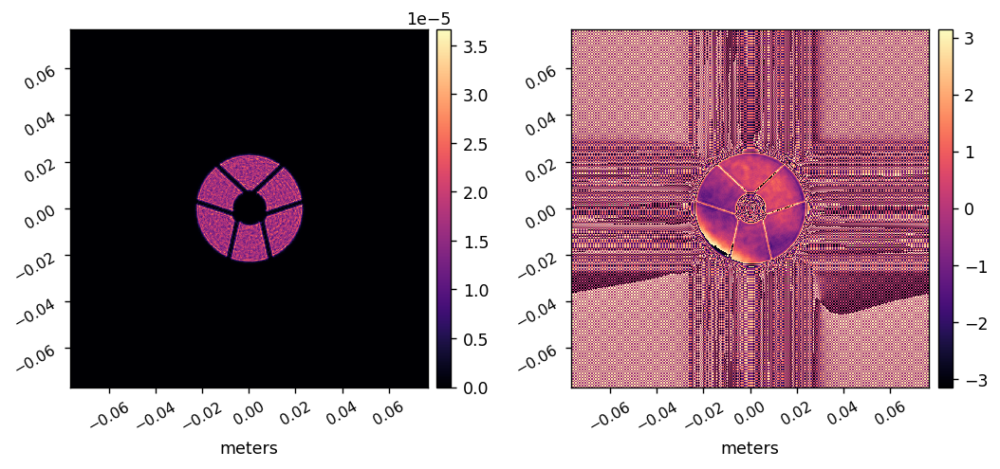

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/oap3_proper.fits


In [93]:
proper.prop_propagate( wavefront, d_dm2_oap3, 'OAP3' )
proper.prop_lens( wavefront, fl_oap3 )
if use_errors != 0: 
    dmap = proper.prop_errormap( wavefront, map_dir+'roman_phasec_OAP3_phase_error_V3.0.fits', WAVEFRONT=True )
    if save_maps: save_map(dmap, wavefront, 'roman_phasec_OAP3_phase_error_V3.0.fits')
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_oap3/2.0 ) 
    
if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'oap3')

# Propagate to 

Propagating to FOLD_3
OPD map saved to:	/groups/douglase/kians-data-files/roman-cgi-phasec-data/hlc-opds/roman_phasec_FOLD3_FLIGHT_measured_coated_phase_error_V2.0.fits


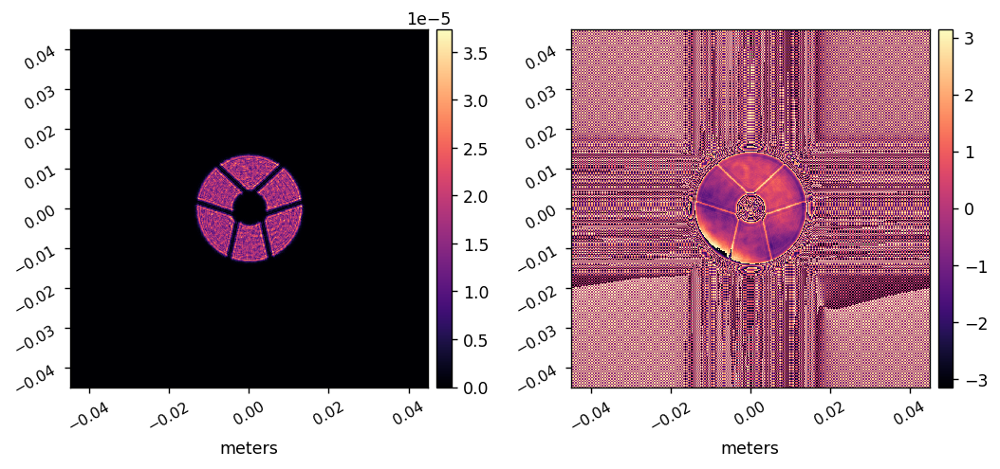

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/fold3_proper.fits


In [94]:
proper.prop_propagate( wavefront, d_oap3_fold3, 'FOLD_3' )
if use_errors != 0: 
    dmap = proper.prop_errormap( wavefront, map_dir+'roman_phasec_FOLD3_FLIGHT_measured_coated_phase_error_V2.0.fits', WAVEFRONT=True )
    if save_maps: save_map(dmap, wavefront, 'roman_phasec_FOLD3_FLIGHT_measured_coated_phase_error_V2.0.fits')
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_fold3/2.0 )
    
if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'fold3')

# Propagate to 

Propagating to OAP4
Applying lens
OPD map saved to:	/groups/douglase/kians-data-files/roman-cgi-phasec-data/hlc-opds/roman_phasec_OAP4_phase_error_V3.0.fits


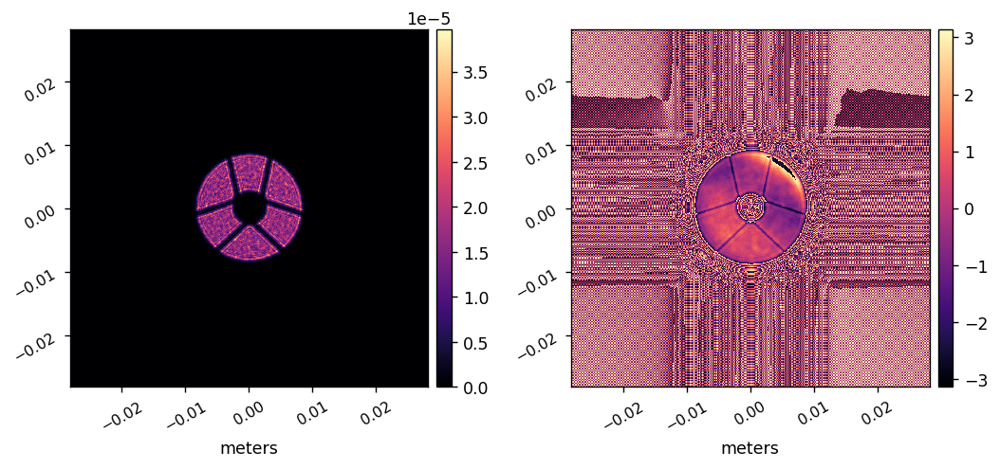

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/oap4_proper.fits


In [95]:
proper.prop_propagate( wavefront, d_fold3_oap4, 'OAP4' )
proper.prop_lens( wavefront, fl_oap4 )
if use_errors != 0:
    dmap = proper.prop_errormap( wavefront, map_dir+'roman_phasec_OAP4_phase_error_V3.0.fits', WAVEFRONT=True )
    if save_maps: save_map(dmap, wavefront, 'roman_phasec_OAP4_phase_error_V3.0.fits')
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_oap4/2.0 )
    
if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'oap4')

# Propagate to 

Propagating to PUPIL_MASK
OPD map saved to:	/groups/douglase/kians-data-files/roman-cgi-phasec-data/hlc-opds/roman_phasec_PUPILFOLD_phase_error_V1.0.fits


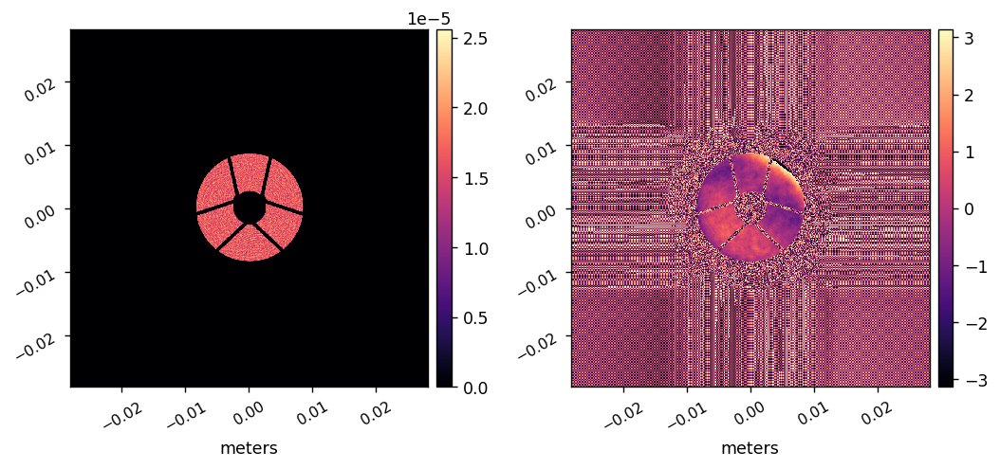

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/puplmask_proper.fits


In [96]:
proper.prop_propagate( wavefront, d_oap4_pupilmask, 'PUPIL_MASK' )    # flat/reflective shaped pupil 
if (is_spc == True or np.isscalar(pupil_mask_array) == False) and use_pupil_mask != 0:
    if np.isscalar(pupil_mask_array): 
        pupil_mask = proper.prop_fits_read( pupil_mask_file )
        pupil_mask = trim( pupil_mask, n )
    else:
        pupil_mask = trim( pupil_mask_array, n )
    if mask_x_shift_pupdiam != 0 or mask_y_shift_pupdiam != 0 or mask_x_shift_m != 0 or mask_y_shift_m != 0:
        # shift SP mask by FFTing it, applying tilt, and FFTing back 
        if mask_x_shift_pupdiam != 0 or mask_y_shift_pupdiam != 0:
            # offsets are normalized to pupil diameter
            xt = -mask_x_shift_pupdiam * pupil_diam_pix * float(pupil_diam_pix)/n
            yt = -mask_y_shift_pupdiam * pupil_diam_pix * float(pupil_diam_pix)/n
        else:
            d_m = proper.prop_get_sampling(wavefront)
            xt = -mask_x_shift_m / d_m * float(pupil_diam_pix)/n
            yt = -mask_y_shift_m / d_m * float(pupil_diam_pix)/n
        x = np.tile( (np.arange(n)-n//2) / (pupil_diam_pix/2.0), (n,1) )
        y = np.transpose(x)
        tilt = complex(0,1) * np.pi * (x*xt + y*yt)
        x = 0
        y = 0
        pupil_mask = ffts( pupil_mask, -1 )
        pupil_mask *= np.exp(tilt)
        pupil_mask = ffts( pupil_mask, 1 )
        pupil_mask = pupil_mask.real
        tilt = 0
    proper.prop_multiply( wavefront, pupil_mask )
    pupil_mask = 0
if use_errors != 0: 
    if is_spc == 1 and use_pupil_mask != 0:
        dmap = proper.prop_errormap( wavefront, map_dir+'roman_phasec_PUPILMASK_phase_error_V1.0.fits', WAVEFRONT=True )
        if save_maps: save_map(dmap, wavefront, 'roman_phasec_PUPILMASK_phase_error_V1.0.fits')
    else:
        dmap = proper.prop_errormap( wavefront, map_dir+'roman_phasec_PUPILFOLD_phase_error_V1.0.fits', WAVEFRONT=True )
        if save_maps: save_map(dmap, wavefront, 'roman_phasec_PUPILFOLD_phase_error_V1.0.fits')
        
if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'puplmask')

# Propagate to 

Propagating to OAP5
Applying lens
OPD map saved to:	/groups/douglase/kians-data-files/roman-cgi-phasec-data/hlc-opds/roman_phasec_OAP5_phase_error_V3.0.fits


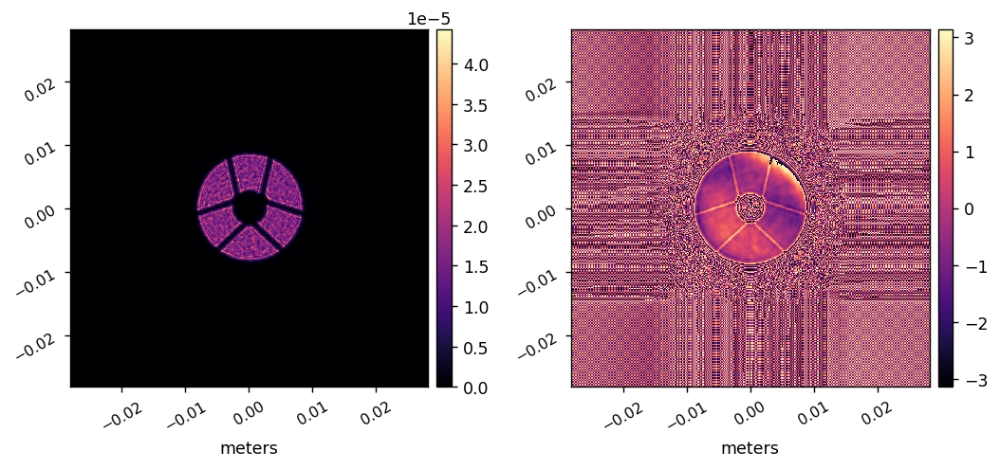

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/oap5_proper.fits


In [97]:
proper.prop_propagate( wavefront, d_pupilmask_oap5, 'OAP5' )
proper.prop_lens( wavefront, fl_oap5 )
if use_errors != 0: 
    dmap = proper.prop_errormap( wavefront, map_dir+'roman_phasec_OAP5_phase_error_V3.0.fits', WAVEFRONT=True )
    if save_maps: save_map(dmap, wavefront, 'roman_phasec_OAP5_phase_error_V3.0.fits')
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_oap5/2.0 )  
    
if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'oap5')

# Propagate to 

Propagating to FPM


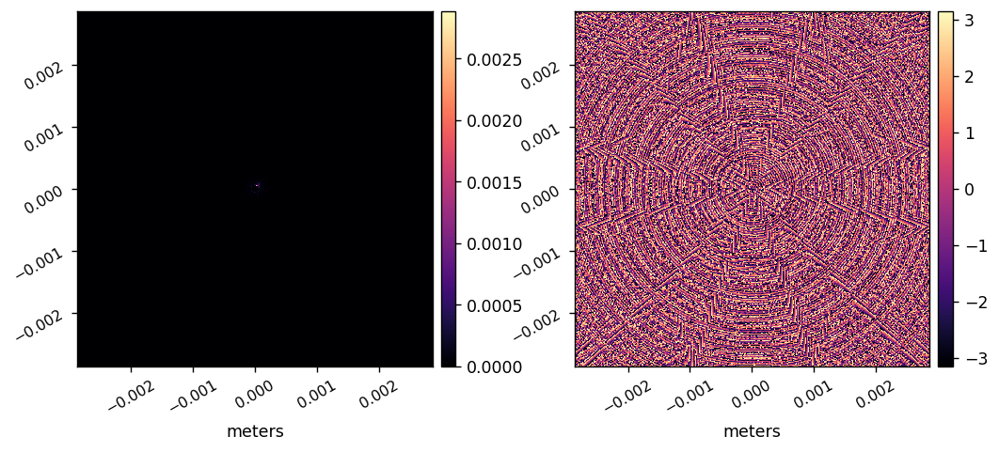

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/fpm_proper.fits


In [98]:
proper.prop_propagate( wavefront, d_oap5_fpm+fpm_z_shift_m, 'FPM', TO_PLANE=True )
if use_fpm == 1:
    if fpm_x_offset != 0 or fpm_y_offset != 0 or fpm_x_offset_m != 0 or fpm_y_offset_m != 0:
        # To shift FPM, FFT field to pupil, apply tilt, FFT back to focus, 
        # apply FPM, FFT to pupil, take out tilt, FFT back to focus 
        if fpm_x_offset != 0 or fpm_y_offset != 0:
            # shifts are specified in lambda0/D
            x_offset_lamD = fpm_x_offset * lambda0_m / lambda_m
            y_offset_lamD = fpm_y_offset * lambda0_m / lambda_m
        else:
            d_m = proper.prop_get_sampling(wavefront)
            x_offset_lamD = fpm_x_offset_m / d_m * float(pupil_diam_pix)/n
            y_offset_lamD = fpm_y_offset_m / d_m * float(pupil_diam_pix)/n
        x = np.tile( (np.arange(n)-n//2) / (pupil_diam_pix/2.0), (n,1) )
        y = np.transpose(x)
        tilt = complex(0,1) * np.pi * (x*x_offset_lamD + y*y_offset_lamD)
        x = 0
        y = 0
        wavefront0 = proper.prop_get_wavefront(wavefront)
        wavefront0 = ffts( wavefront0, -1 )
        wavefront0 *= np.exp(tilt)
        wavefront0 = ffts( wavefront0, 1 )
        wavefront.wfarr[:,:] = proper.prop_shift_center(wavefront0)
        wavefront0 = 0

    if is_hlc == True:
        # use MFTs to use super-sampled FPM
        wavefront0 = proper.prop_get_wavefront(wavefront)
        wavefront0 = ffts( wavefront0, 1 )              # to virtual pupil
        wavefront0 *= fpm_array[0,0]                    # apply amplitude & phase from FPM clear area
        nfpm = fpm_array.shape[0]
        fpm_sampling_lamdivD = fpm_sampling_lam0divD * fpm_lam0_m / lambda_m    # FPM sampling at current wavelength in lambda_m/D
        wavefront_fpm = mft2(wavefront0, fpm_sampling_lamdivD, pupil_diam_pix, nfpm, +1)   # MFT to highly-sampled focal plane
        wavefront_fpm *= fpm_mask * (fpm_array - 1)      # subtract field inside FPM region, add in FPM-multiplied region
        wavefront_fpm = mft2(wavefront_fpm, fpm_sampling_lamdivD, pupil_diam_pix, n, -1)        # MFT back to virtual pupil
        wavefront0 += wavefront_fpm
        wavefront_fpm = 0
        wavefront0 = ffts( wavefront0, -1 )     # back to normally-sampled focal plane to continue propagation
        wavefront.wfarr[:,:] = proper.prop_shift_center(wavefront0)
        wavefront0 = 0
    elif is_spc == True:
        # super-sample FPM
        wavefront0 = proper.prop_get_wavefront(wavefront)
        wavefront0 = ffts( wavefront0, 1 )                # to virtual pupil
        wavefront0 = trim(wavefront0, n_mft)
        if np.isscalar(fpm_array):
            fpm_array = proper.prop_fits_read( fpm_file )
            fpm_sampling_lamdivD = fpm_sampling_lam0divD * fpm_lam0_m / lambda_m     # FPM sampling at current wavelength in lam/D
        else:
            m_per_lamdivD = proper.prop_get_sampling(wavefront) / (pupil_diam_pix / n)
            fpm_sampling_lamdivD = fpm_array_sampling_m / m_per_lamdivD
        nfpm = fpm_array.shape[1]
        wavefront0 = mft2(wavefront0, fpm_sampling_lamdivD, pupil_diam_pix, nfpm, +1)   # MFT to highly-sampled focal plane
        wavefront0 *= fpm_array
        wavefront0 = mft2(wavefront0, fpm_sampling_lamdivD, pupil_diam_pix, n, -1)  # MFT to virtual pupil 
        wavefront0 = ffts( wavefront0, -1 )    # back to normally-sampled focal plane
        wavefront.wfarr[:,:] = proper.prop_shift_center(wavefront0)
        wavefront0 = 0

    if fpm_x_offset != 0 or fpm_y_offset != 0 or fpm_x_offset_m != 0 or fpm_y_offset_m != 0:
        wavefront0 = proper.prop_get_wavefront(wavefront)
        wavefront0 = ffts( wavefront0, -1 )
        wavefront0 *= np.exp(-tilt)
        wavefront0 = ffts( wavefront0, 1 )
        wavefront.wfarr[:,:] = proper.prop_shift_center(wavefront0)
        wavefront0 = 0
        tilt = 0

if pinhole_diam_m != 0:
    # "pinhole_diam_m" is pinhole diameter in meters
    dx_m = proper.prop_get_sampling(wavefront)
    dx_pinhole_diam_m = pinhole_diam_m / 101.0        # 101 samples across pinhole
    n_out = 105
    m_per_lamD = dx_m * n / float(pupil_diam_pix)        # current focal plane sampling in lambda_m/D
    dx_pinhole_lamD = dx_pinhole_diam_m / m_per_lamD    # pinhole sampling in lambda_m/D
    n_in = int(round(pupil_diam_pix * 1.2))
    wavefront0 = proper.prop_get_wavefront(wavefront)
    wavefront0 = ffts( wavefront0, +1 )            # to virtual pupil
    wavefront0 = trim(wavefront0, n_in)
    m = dx_pinhole_lamD * n_in * float(n_out) / pupil_diam_pix
    wavefront0 = mft2( wavefront0, dx_pinhole_lamD, pupil_diam_pix, n_out, 1)        # MFT to highly-sampled focal plane
    p = (radius(n_out)*dx_pinhole_diam_m) <= (pinhole_diam_m/2.0)
    p = p.astype(np.int)
    wavefront0 *= p
    p = 0
    wavefront0 = mft2( wavefront0, dx_pinhole_lamD, pupil_diam_pix, n, -1)            # MFT back to virtual pupil
    wavefront0 = ffts( wavefront0, -1 )            # back to normally-sampled focal plane
    wavefront.wfarr[:,:] = proper.prop_shift_center(wavefront0)
    wavefront0 = 0
    
if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'fpm')

# Propagate to 

Propagating to OAP6
Applying lens
OPD map saved to:	/groups/douglase/kians-data-files/roman-cgi-phasec-data/hlc-opds/roman_phasec_OAP6_phase_error_V3.0.fits


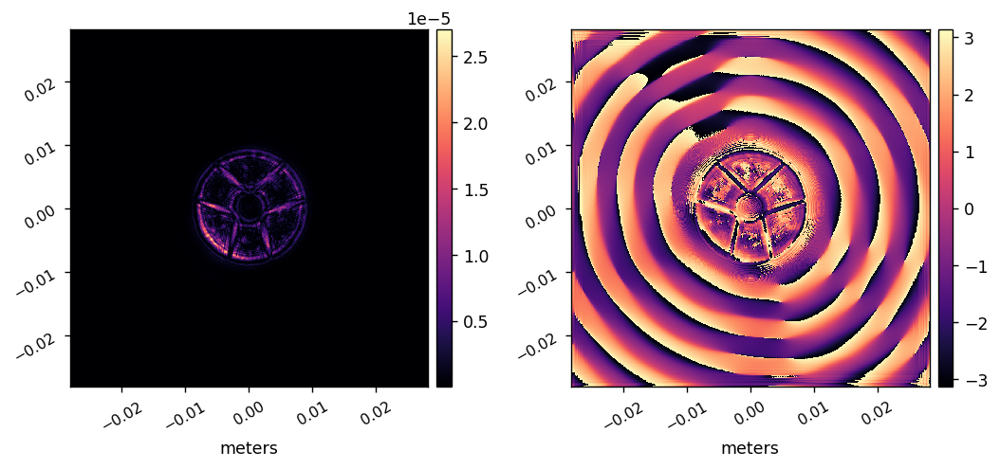

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/oap6_proper.fits


In [99]:
proper.prop_propagate( wavefront, d_fpm_oap6-fpm_z_shift_m, 'OAP6' )
proper.prop_lens( wavefront, fl_oap6 )
if use_errors != 0 and end_at_fpm_exit_pupil == 0: 
    dmap = proper.prop_errormap( wavefront, map_dir+'roman_phasec_OAP6_phase_error_V3.0.fits', WAVEFRONT=True )
    if save_maps: save_map(dmap, wavefront, 'roman_phasec_OAP6_phase_error_V3.0.fits')
if use_aperture != 0 or pinhole_diam_m != 0: proper.prop_circular_aperture( wavefront, diam_oap6/2.0 )  

# if end_at_fpm_exit_pupil == 1:
#     proper.prop_propagate( wavefront, d_oap6_exitpupil, 'FPM EXIT PUPIL' )
#     (wavefront, sampling_m) = proper.prop_end( wavefront, NOABS=True )
#     wavefront = trim(wavefront, n)
#     return wavefront, sampling_m

if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'oap6')

# Propagate to 

Propagating to LYOT STOP


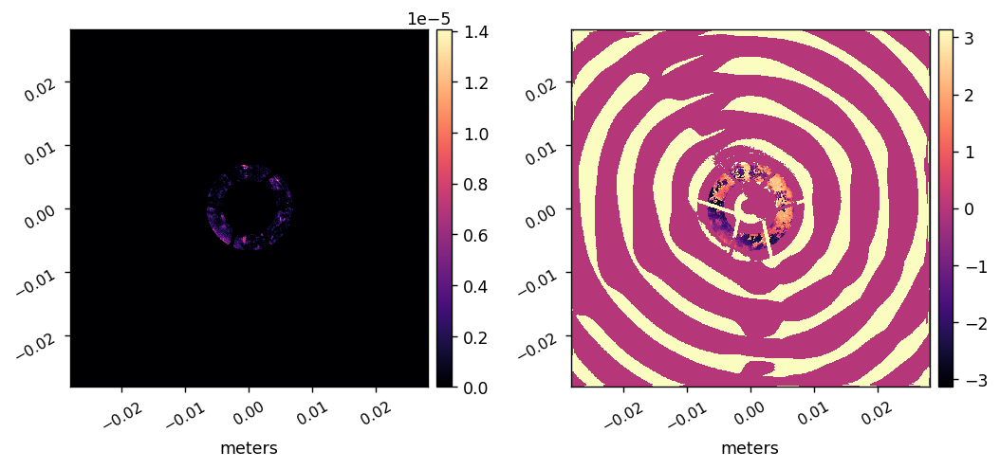

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/lyotstop_proper.fits


In [100]:
proper.prop_propagate( wavefront, d_oap6_lyotstop, 'LYOT STOP' )
if use_lyot_stop != 0:
    if np.isscalar(lyot_stop_array):
        lyot = proper.prop_fits_read( lyot_stop_file )
        lyot = trim( lyot, n )
    else:
        lyot = trim( lyot_stop_array, n )
    if lyot_x_shift_pupdiam != 0 or lyot_y_shift_pupdiam != 0 or lyot_x_shift_m != 0 or lyot_y_shift_m != 0:
        # apply shift to lyot stop by FFTing the stop, applying a tilt, and FFTing back
        if lyot_x_shift_pupdiam != 0 or lyot_y_shift_pupdiam != 0:
            # offsets are normalized to pupil diameter
            xt = -lyot_x_shift_pupdiam * pupil_diam_pix * float(pupil_diam_pix)/n
            yt = -lyot_y_shift_pupdiam * pupil_diam_pix * float(pupil_diam_pix)/n
        else:
            d_m = proper.prop_get_sampling(wavefront)
            xt = -lyot_x_shift_m / d_m * float(pupil_diam_pix)/n
            yt = -lyot_y_shift_m / d_m * float(pupil_diam_pix)/n
        x = np.tile( (np.arange(n)-n//2) / (pupil_diam_pix/2.0), (n,1) )
        y = np.transpose(x)
        tilt = complex(0,1) * np.pi * (x*xt + y*yt)
        x = 0
        y = 0
        lyot = ffts(lyot,-1)
        lyot *= np.exp(tilt)
        lyot = ffts( lyot, 1 )
        lyot = lyot.real
        tilt = 0
    proper.prop_multiply( wavefront, lyot )
    lyot = 0
if use_pupil_lens != 0 or pinhole_diam_m != 0: proper.prop_circular_aperture( wavefront, 1.079, NORM=True )
    
if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'lyotstop')

# Propagate to 

Propagating to OAP7
Applying lens
OPD map saved to:	/groups/douglase/kians-data-files/roman-cgi-phasec-data/hlc-opds/roman_phasec_OAP7_phase_error_V3.0.fits


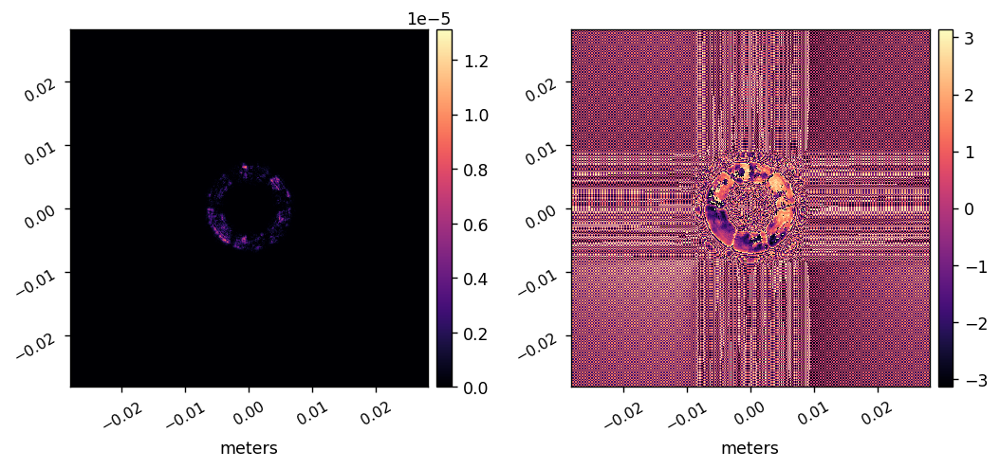

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/oap7_proper.fits


In [101]:
proper.prop_propagate( wavefront, d_lyotstop_oap7, 'OAP7' )
proper.prop_lens( wavefront, fl_oap7 )
if use_errors != 0: 
    dmap = proper.prop_errormap( wavefront, map_dir+'roman_phasec_OAP7_phase_error_V3.0.fits', WAVEFRONT=True )
    if save_maps: save_map(dmap, wavefront, 'roman_phasec_OAP7_phase_error_V3.0.fits')
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_oap7/2.0 ) 
    
if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'oap7')

# Propagate to 

Propagating to FIELD_STOP


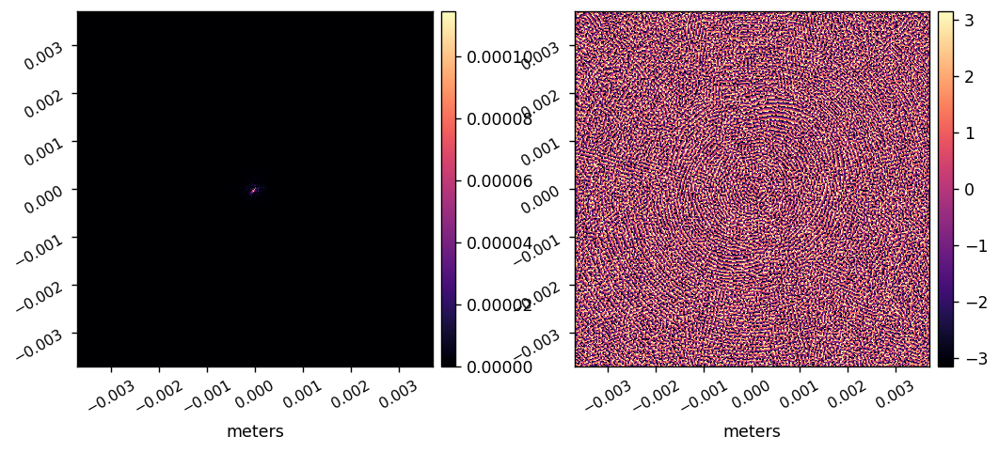

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/fieldstop_proper.fits


In [102]:
proper.prop_propagate( wavefront, d_oap7_fieldstop, 'FIELD_STOP' )
if np.isscalar(field_stop_array):
    if use_field_stop != 0 and cor_type == 'hlc':
        sampling_lamD = float(pupil_diam_pix) / n      # sampling at focus in lambda_m/D
        stop_radius = field_stop_radius_lam0 / sampling_lamD * (lambda0_m/lambda_m) * proper.prop_get_sampling(wavefront)
        if field_stop_x_offset != 0 or field_stop_y_offset != 0:
            # convert offsets in lambda0/D to meters
            x_offset_lamD = field_stop_x_offset * lambda0_m / lambda_m
            y_offset_lamD = field_stop_y_offset * lambda0_m / lambda_m
            pupil_ratio = float(pupil_diam_pix) / n
            field_stop_x_offset_m = x_offset_lamD / pupil_ratio * proper.prop_get_sampling(wavefront)
            field_stop_y_offset_m = y_offset_lamD / pupil_ratio * proper.prop_get_sampling(wavefront)
        proper.prop_circular_aperture( wavefront, stop_radius, -field_stop_x_offset_m, -field_stop_y_offset_m )
else:
    wavefront0 = proper.prop_get_wavefront(wavefront)
    wavefront0 = ffts( wavefront0, 1 )                # to virtual pupil
    wavefront0 = trim(wavefront0, n_mft)
    m_per_lamdivD = proper.prop_get_sampling(wavefront) / (pupil_diam_pix / n)
    field_stop_sampling_lamdivD = field_stop_array_sampling_m / m_per_lamdivD
    nstop = field_stop_array.shape[1]
    wavefront0 = mft2(wavefront0, field_stop_sampling_lamdivD, pupil_diam_pix, nstop, 1)   # MFT to highly-sampled focal plane
    wavefront0 *= field_stop_array
    wavefront0 = mft2(wavefront0, field_stop_sampling_lamdivD, pupil_diam_pix, n, -1)  # MFT to virtual pupil 
    wavefront0 = ffts( wavefront0, -1 )    # back to normally-sampled focal plane
    wavefront.wfarr[:,:] = proper.prop_shift_center(wavefront0)
    
if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'fieldstop')

# Propagate to 

Propagating to OAP8
Applying lens
OPD map saved to:	/groups/douglase/kians-data-files/roman-cgi-phasec-data/hlc-opds/roman_phasec_OAP8_phase_error_V3.0.fits


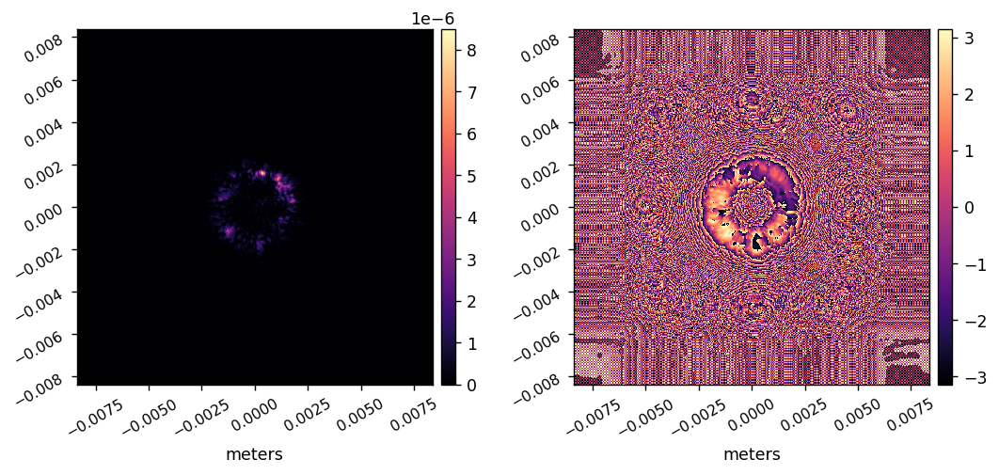

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/oap8_proper.fits


In [103]:
proper.prop_propagate( wavefront, d_fieldstop_oap8, 'OAP8' )
proper.prop_lens( wavefront, fl_oap8 )
if use_errors != 0: 
    dmap = proper.prop_errormap( wavefront, map_dir+'roman_phasec_OAP8_phase_error_V3.0.fits', WAVEFRONT=True )
    if save_maps: save_map(dmap, wavefront, 'roman_phasec_OAP8_phase_error_V3.0.fits')
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_oap8/2.0 )
    
if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'oap8')

# Propagate to 

Propagating to filter
OPD map saved to:	/groups/douglase/kians-data-files/roman-cgi-phasec-data/hlc-opds/roman_phasec_FILTER_phase_error_V1.0.fits


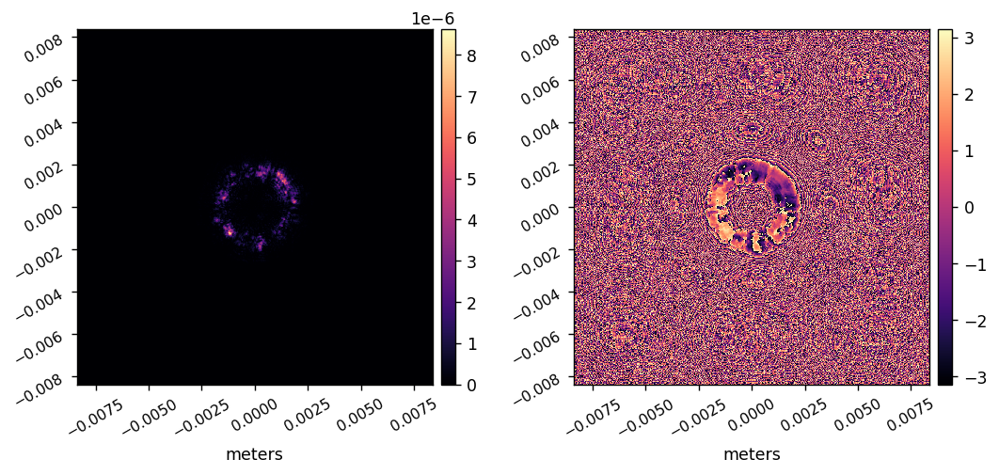

Wavefront saved to:	/groups/douglase/kians-data-files/roman-cgi-wfs/hlc/filter_proper.fits


In [104]:
proper.prop_propagate( wavefront, d_oap8_filter, 'filter' )
if use_errors != 0: 
    dmap = proper.prop_errormap( wavefront, map_dir+'roman_phasec_FILTER_phase_error_V1.0.fits', WAVEFRONT=True )
    if save_maps: save_map(dmap, wavefront, 'roman_phasec_FILTER_phase_error_V1.0.fits')
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_filter/2.0 )
    
if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'filter')

# Propagate to 

In [105]:
if use_pupil_lens == 0 and use_defocus_lens == 0:
        # use imaging lens to create normal focus
    if use_lens_errors != 0:
        imaging_lens_error_files = [map_dir+'roman_phasec_LENS_phase_error_V1.0.fits', ' ']
    else:
        imaging_lens_error_files = ' '
    to_from_doublet( wavefront, d_filter_lens, d_lens_fold4+d_fold4_image, 
            0.10792660718579995, -0.10792660718579995, 0.003, glass_index('S-BSL7R', lambda_m, data_dir), 0.0005, 
            1e10, 0.10608379812011390, 0.0025, glass_index('PBM2R', lambda_m, data_dir), 
            'IMAGING LENS', 'IMAGE', ERROR_MAP_FILES=imaging_lens_error_files, TO_PLANE=1 )
elif use_pupil_lens != 0:
    # use pupil imaging lens
    if use_lens_errors != 0:
        pupil_lens_error_files = [ map_dir+'roman_phasec_PUPIL_IMAGE_LENS1_measured_phase_error_V2.0.fits', map_dir+'roman_phasec_PUPIL_IMAGE_LENS2_measured_phase_error_V2.0.fits']
    else:
        pupil_lens_error_files = ' '
    to_from_doublet( wavefront, d_filter_lens, d_lens_fold4+d_fold4_image, 
            0.03449714, -0.20846556, 0.003, glass_index('S-BSL7R', lambda_m, data_dir), 0.0007, 
            1e10, 0.05453792, 0.0025, glass_index('PBM2R', lambda_m, data_dir), 
            'PUPIL IMAGING LENS', 'IMAGE', ERROR_MAP_FILES=pupil_lens_error_files, TO_PLANE=0 )
elif use_defocus_lens != 0:     
    # use one of 4 defocusing lenses
    c_lens = [0.01325908247149297, 0.01243982235933671, 0.01163480668768688, 0.005663476241717166]
    if use_lens_errors != 0:
        defocus_lens_error_file = map_dir+'roman_phasec_DEFOCUSLENS' + str(use_defocus_lens) + '_measured_phase_error_V2.0.fits'
    else:
        defocus_lens_error_file = ' '
    to_from_singlet( wavefront, d_filter_lens, d_lens_fold4+d_fold4_image, 
             0.001 / c_lens[use_defocus_lens-1], 1e10, 0.005, glass_index('SILICA', lambda_m, data_dir), 
            'DEFOCUS LENS', 'IMAGE', ERROR_MAP_FILE=defocus_lens_error_file, TO_PLANE=(use_defocus_lens == 3 or use_defocus_lens == 4) )
    
if display_wfs: display_wave(wavefront)
if save_wfs: save_wf(wavefront, 'image')

Propagating to IMAGING LENS
Applying lens at IMAGING LENS lens #1


ValueError: READMAP: No pixel scale (PIXSIZE) specified in /groups/douglase/kians-data-files/phasec_data/maps/roman_phasec_LENS_phase_error_V1.0.fits header. Stopping

# Obtain final wavefront and resample

In [ ]:
(wf_arr, sampling_m) = proper.prop_end( wavefront, NOABS=True )

# remove phase term due to pupil not at front focus of lens (only in direct imaging mode) 
# if use_defocus_lens == 0 and use_pupil_lens == 0 and end_at_exit_pupil == 0:
#     wf_arr *= np.exp((np.complex(0,1) * 16 * np.pi / lambda_m * 0.0735) * rsqr)

# resample as needed
if final_sampling_m != 0:
    mag = sampling_m / final_sampling_m
    sampling_m = final_sampling_m 
    wf_arr = proper.prop_magnify( wf_arr, mag, output_dim, AMP_CONSERVE=True )
elif final_sampling_lam0 != 0:
    if use_pupil_lens != 0 or use_defocus_lens != 0 or end_at_exit_pupil != 0:
        raise Exception('ERROR: Cannot specify final_sampling_lam0 when using pupil or defocus lens or ending at exit pupil.')
    else:
        mag = (float(pupil_diam_pix)/n) / final_sampling_lam0 * (lambda_m/lambda0_m)
        sampling_m = sampling_m / mag
        wf_arr = proper.prop_magnify( wf_arr, mag, output_dim, AMP_CONSERVE=True )
else:
    wf_arr = trim(wf_arr, output_dim)
    
wf_int = np.abs(wf_arr)**2
wf_phase = np.angle(wf_arr)
wf_sampling = sampling_m

if display_wfs: misc.myimshow2(wf_int, wf_phase, lognorm1=True,
                               pxscl1=sampling_m*u.m/u.pix, pxscl2=sampling_m*u.m/u.pix)
if save_wfs: 
    wf = np.zeros(shape=(2, wf_int.shape[0], wf_int.shape[0]))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling
    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    
    wf_fpath = wf_dir/('resamped_image' + '_proper' + '.fits')
    wf_hdu.writeto(wf_fpath, overwrite=True)
    print( 'Wavefront saved to:\t'+str(wf_fpath) ) 
    

# Check Results

Lambda = 5.7500E-07   Throughput = 1.00
Applying lens
Propagating to secondary
ERROR! Session/line number was not unique in database. History logging moved to new session 1657
Applying lens
Propagating to POMA FOLD
Propagating to M3
Applying lens
Propagating to M4
Applying lens
Propagating to M5
Applying lens
Propagating to TT FOLD
Propagating to FSM
Propagating to OAP1
Applying lens
Propagating to FOCM
Propagating to OAP2
Applying lens
Propagating to DM1
Propagating to DM2
Propagating to OAP3
Applying lens
Propagating to FOLD_3
Propagating to OAP4
Applying lens
Propagating to PUPIL_MASK
Propagating to OAP5
Applying lens
Propagating to FPM
Propagating to OAP6
Applying lens
Propagating to LYOT STOP
Propagating to OAP7
Applying lens
Propagating to FIELD_STOP
Propagating to OAP8
Applying lens
Propagating to filter
Propagating to IMAGING LENS
Applying lens at IMAGING LENS lens #1
Propagating
Applying lens at IMAGING LENS lens #2
Propagating to IMAGE
Total elapsed time (seconds) =  10.2825


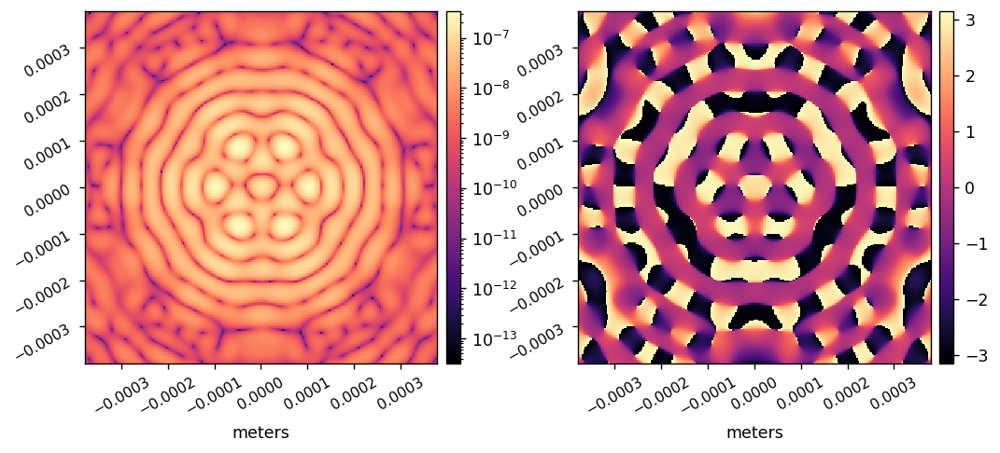

In [40]:
lam_array = np.array([lambda_m*1e6])

(wfs, wfs_sampling_m) = proper.prop_run_multi('roman_phasec', lam_array, output_dim, QUIET=True, 
                                                PASSVALUE={'cor_type':cor_type,
                                                           'final_sampling_lam0':final_sampling_lam0, 
                                                           'source_x_offset':source_x_offset,
                                                           'use_fpm':use_fpm,
                                                           'use_hlc_dm_patterns':use_hlc_dm_patterns,
                                                           'use_errors': use_errors,
                                                           'use_pupil_defocus':use_pupil_defocus,
                                                           'use_dm1':use_dm1, 'dm1_m':dm1_m, 
                                                           'use_dm2':use_dm2, 'dm2_m':dm2_m,
                                                           'use_field_stop':use_field_stop,
                                                           'polaxis':polaxis,
                                                          })
proper_psf = wfs[0]
psf_sampling_m = wfs_sampling_m[0]*u.m/u.pix

misc.myimshow2(np.abs(proper_psf)**2, np.angle(proper_psf), lognorm1=True,
               pxscl1=psf_sampling_m, pxscl2=psf_sampling_m,)

In [ ]:
int_diff = np.abs(np.abs(proper_psf)**2-wf_int)
phase_diff = np.angle(proper_psf)-wf_phase
misc.myimshow2(int_diff, phase_diff, lognorm1=True,
               pxscl1=psf_sampling_m, pxscl2=psf_sampling_m,)